## <u>Informations concernant les profils de nos clients

La formulation de la requête d'Antoine est assez vague... Elle nous laisse cependant un grande indépendance quant à la définition des informations qu'il serait pertinent d'extraire de nos données.
La première question à laquelle je brûle d'envie de répondre est celle de savoir **quel est l'age moyen de nos clients**. Pour répondre à cette interrogation on va utiliser le df customers. 

In [116]:
customers.head()

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


Ce df présente une information interessante à savoir **la date de naissance de chacun des clients.** C'est grace à cette information qu'on va créer une nouvelle colonne **age** dans notre df custumers. On s'aidera du module **datetime**.

In [117]:
current_year = dt.now().strftime('%Y')
customers["age"] = int(current_year) - customers["birth"]

La colonne est créee elle est le résultat de la soustraction est entre notre année et celle de naissance des chacun des clients

In [118]:
customers.head()

,client_id,sex,birth,age
0,c_4410,f,1967,56
1,c_7839,f,1975,48
2,c_1699,f,1984,39
3,c_5961,f,1962,61
4,c_5320,m,1943,80


Pourvu de ces informations il est alors très simple de connaitre l'âge moyen de nos client. Pour ce faire utilisons la méthode .mean().

In [119]:
round(customers['age'].mean(),1)

44.7

L'âge moyen de nos client est de 43,7 ans. Ce qui n'est pas foncièrement vieux, mais pas tout jeune non plus. Ce qu'on va faire, c'est nous interesser à la distribuion de ces ages. Afin de savoir ce qui se cache derrière cette moyenne. 
Pour ce faire on va utiliser une boite à moustache.

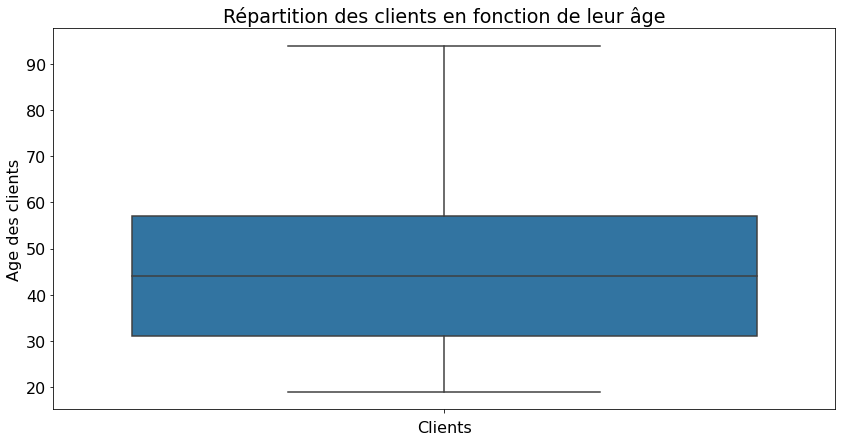

In [120]:
sns.boxplot(data=customers,y='age')
plt.xlabel('Clients')
plt.ylabel('Age des clients')
plt.title('Répartition des clients en fonction de leur âge')
plt.show()

Qu'est ce qu'on peut voir ? On voit que la moitié de nos client ont environs 40 ans. L'age de l'autre moitié s'étend jusqu'à un peu plus de 90 ans. Les trois quart on moins de 55 ans. Et 25 % a moins de 30 ans. 

## <u>REPARTITION PAR SEXE

Après l'age il serait interessant de savoir **si notre clientèle est paritaire au niveau de la repartion par sexe** ou si nous touchons une clientèle **plutot féminine** ou au contraire **plutot masculine**. Pour répondre à ces question on utilisera à nouveau le df **customers**.
On va commencer par proceder à un tout petit changement, à savoir changer les minusules par des majuscules en ce qui concerne le sexe des clients grace à la méthode .replace()

In [121]:
customers = customers.replace('f', 'F') 
customers = customers.replace('m', 'M')

On va ensuite compter les client tout en les regroupant par sexe grace à la méthode .groupby() et .count()

In [122]:
repartition_sexe=customers.groupby(["sex"])["client_id"].count()
repartition_sexe= repartition_sexe.to_frame(name= "Nb de client").reset_index()
repartition_sexe

,sex,Nb de client
0,F,4490
1,M,4131


4490 Femmes pour 4131 hommes, une presque égalité. Passons à la représentation  graphique !

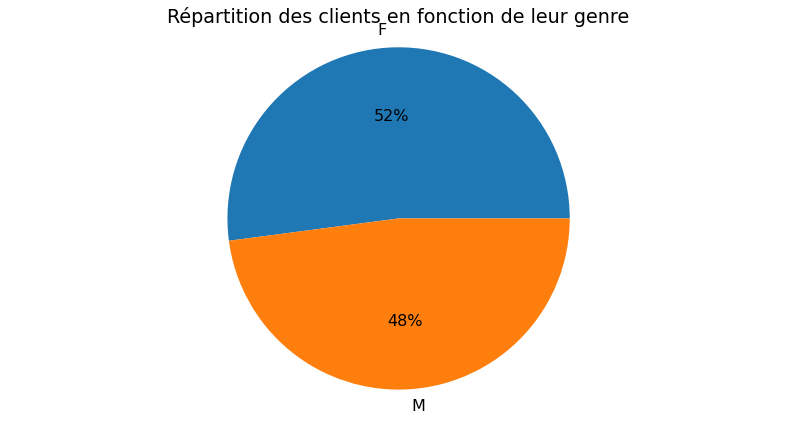

In [123]:
fig4, ax4 = plt.subplots()

labels = repartition_sexe["sex"]
ax4.pie(repartition_sexe["Nb de client"],labels=labels, autopct='%.0f%%')
ax4.set(title='Répartition des clients en fonction de leur genre')
ax4.axis("equal")

plt.show()

La repartition des client par sexe semble assez paritaire, 52% de femmes contre 48%  d'hommes une égalité quasi-parfaite. Passon à la répartition du Chiffre d'affaire par genre

In [281]:
reelles_transactions = reelles_transactions.replace('f', 'F') 
reelles_transactions = reelles_transactions.replace('m', 'M') 


In [282]:
repartition_ca_genre = reelles_transactions.groupby(["sex"])["price"].sum()
repartition_ca_genre = repartition_ca_genre.to_frame(name= "CA par genre").reset_index()
repartition_ca_genre

,sex,CA par genre
0,F,5860851.96
1,M,5995084.51


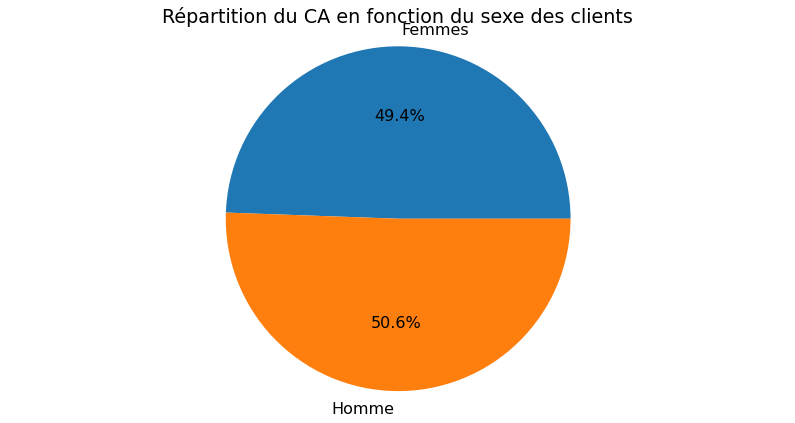

In [283]:
fig5, ax5 = plt.subplots()
ax5.pie(repartition_ca_genre["CA par genre"],
        labels=["Femmes","Homme"],
        autopct="%1.1f%%")
ax5.axis("equal")
ax5.set(aspect= "equal",title='Répartition du CA en fonction du sexe des clients')
plt.show()

A nouveau un comportement qui semblent presque similaire. Passons au nombre d'achat par genre. Pour cela, on comptera le nombre de sessions que l'on groupera en fonction du sexe des clients grace à la méthode .groupby() et .count()

In [284]:
nbr_achats_genre = reelles_transactions.groupby(["sex"])["session_id"].count()
nbr_achats_genre = nbr_achats_genre.to_frame( name= "Nb d'achat par genre").reset_index()
nbr_achats_genre

,sex,Nb d'achat par genre
0,F,338402
1,M,340930


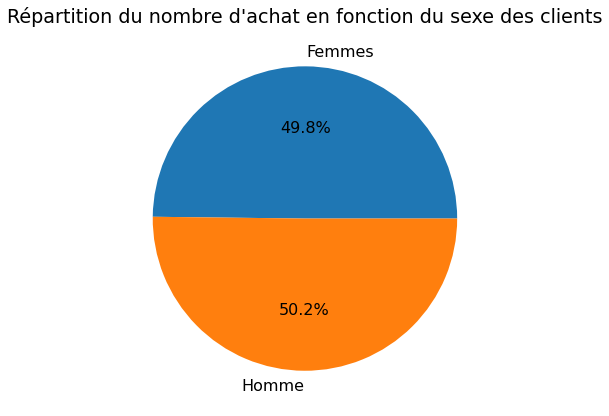

In [127]:
fig6, ax6 = plt.subplots()
ax6.pie(nbr_achats_genre["Nb d'achat par genre"],
        labels=["Femmes","Homme"],
        autopct="%1.1f%%")

ax6.set(aspect= "equal",title="Répartition du nombre d'achat en fonction du sexe des clients")
plt.show()

In [128]:
reelles_transactions.head()

,id_prod,date,session_id,client_id,sex,birth,price,categ,year,month,day
0,0_1259,2021-03-01 00:01:07.843138,s_1,c_329,f,1967.00,11.99,0.00,2021,3,1
24436,0_1390,2021-03-01 00:02:26.047414,s_2,c_664,m,1960.00,19.37,0.00,2021,3,1
55326,0_1352,2021-03-01 00:02:38.311413,s_3,c_580,m,1988.00,4.50,0.00,2021,3,1
141505,0_1458,2021-03-01 00:04:54.559692,s_4,c_7912,f,1989.00,6.55,0.00,2021,3,1
73894,0_1358,2021-03-01 00:05:18.801198,s_5,c_2033,f,1956.00,16.49,0.00,2021,3,1


In [285]:
customers["age_range"] = pd.cut(x= customers["age"], bins=[18,25,35,55,110], include_lowest=False, ordered=True)

In [286]:
reelles_transactions["age"] = int(current_year) - reelles_transactions["birth"]

Ajoutons les tranches d'ages

In [ ]:
reelles_transactions["age_range"] = pd.cut(x= reelles_transactions["age"], bins=[18,25,35,55,110], include_lowest=False, ordered=True)

In [134]:
repartition_achats_tranche_age = reelles_transactions.groupby(["age_range"])["price"].sum()

In [135]:
repartition_achats_tranche_age= repartition_achats_tranche_age.to_frame("CA").reset_index()
repartition_achats_tranche_age

,age_range,CA
0,"(18, 25]",2007985.79
1,"(25, 35]",2296519.45
2,"(35, 55]",5391442.96
3,"(55, 110]",2159988.27


In [136]:
repartition_achats_tranche_age

,age_range,CA
0,"(18, 25]",2007985.79
1,"(25, 35]",2296519.45
2,"(35, 55]",5391442.96
3,"(55, 110]",2159988.27


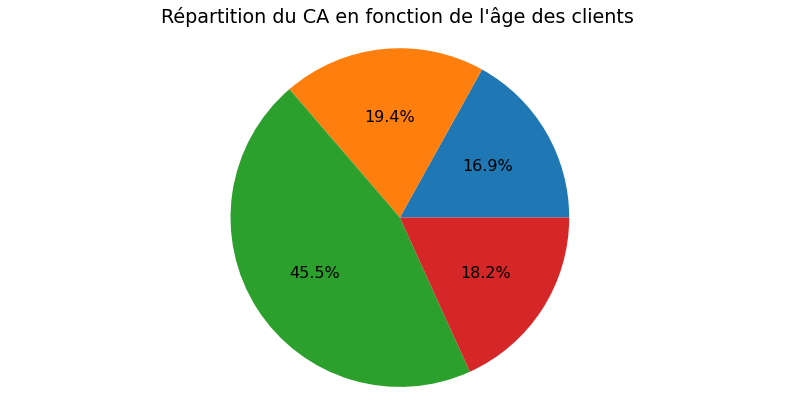

In [289]:
repartition_achats_tranche_age = reelles_transactions.groupby(["age_range"])["price"].sum()
repartition_achats_tranche_age
fig6, ax6 = plt.subplots()
ax6.pie(repartition_achats_tranche_age,
        autopct="%1.1f%%")
ax6.axis("equal")
ax6.set(aspect= "equal",title="Répartition du CA en fonction de l'âge des clients")
plt.show()

In [138]:
repartition_achats_tranche_age.nlargest

<bound method Series.nlargest of age_range
(18, 25]    2007985.79
(25, 35]    2296519.45
(35, 55]    5391442.96
(55, 110]   2159988.27
Name: price, dtype: float64>

Lorsqu'on s'interesse au profil des clients, des questions judicieuses se doivent d'être posées afin d'avoir des réponses pertinentes. 
Par exemple, au vu des informations dont on dispose, il pourrait apparaitre pertinent de connaitre le nombre d'achat moyen par client ainsi que le montant moyen des achat par client sur l'entiereté de la période. 
L'erreur ici, serait d'utiliser le df "reelles_transactions" et non "jointure_finale". Il faudra pour ces deux indicateurs ous interresser à tous les clients et non pas à ceux acheteurs uniquement.

In [139]:
round(jointure_finale.groupby(["client_id"])["price"].sum().mean(),2)

1375.24


Le montant moyen du panier par client est de 1375.24 €

Pour ce qui est du nombre d'achat moyen par client, on utliseras la combinaison de méthode .count() et mean().On va compter le nombre de session moyenne par client arrondies au dixième

In [140]:
round(jointure_finale.groupby(["client_id"])["session_id"].count().mean(),2)

78.8

Chaque client aurait procédé à 78,8 achats au cours de la durée d'existence de notre site internet

Parfait, et si on essayait de déterminer qui sont nos meilleurs clients ? En terme de nombre de vente tout d'abord, puis en terme de chiffre d'affaire. Pour ce faire, on va dans un premier temps on va définier un requete qui nous donnera le nombre de "session_id" par client grace à la combinaison des méthodes .groupby() et count().

In [141]:
reelles_transactions.groupby(["client_id"])["session_id"].count()

client_id
c_1        39
c_10       58
c_100       8
c_1000    125
c_1001    102
         ... 
c_995      14
c_996      95
c_997      59
c_998      53
c_999      46
Name: session_id, Length: 8600, dtype: int64

On va enregister cette Série dans une variable, qu' on nommera "nombre_d'achat_par_client"

In [142]:
nombre_d_achat_par_client =reelles_transactions.groupby(["client_id"])["session_id"].count()

Bien . Pour avoir le top 10 des client qui on eu effectué le plus d'achat on peut utiliser la méthode sort.values() ou la méthode .nlargest() 

In [143]:
nombre_d_achat_par_client.nlargest(10)

client_id
c_1609    25488
c_6714     9187
c_3454     6773
c_4958     5195
c_3263      403
c_2140      402
c_2595      398
c_2077      384
c_1637      380
c_7421      379
Name: session_id, dtype: int64

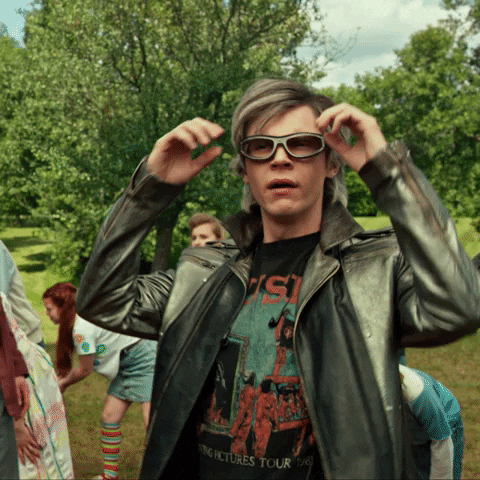

Wow ! Les quatre premiers client culminent a plus de 5000 achats depuis la création du site, et le client qui fait le plus appel à nos services en a réalisé quatre fois plus , soit plus de 25000 achats sur cette meme période. 

In [144]:
Client_1609 =reelles_transactions.loc[reelles_transactions['client_id'] == 'c_1609'].groupby("id_prod")["id_prod"].count()
Client_6714 = reelles_transactions.loc[reelles_transactions['client_id'] == 'c_6714'].groupby("id_prod")["id_prod"].count()

In [145]:
Client_6714.to_frame("Nb d'achat")

,Nb d'achat
id_prod,
0_0,20
0_1,4
0_1000,11
0_1001,6
0_1002,10
...,...
2_46,6
2_57,1
2_62,5


In [146]:
Client_1609.to_frame("Nb d'achat")

,Nb d'achat
id_prod,
0_0,65
0_1,14
0_10,2
0_1000,22
0_1001,14
...,...
1_95,6
1_97,5
1_98,9


In [147]:
Client_6714.nlargest(10)

id_prod
1_498    48
1_403    42
1_383    39
1_400    38
1_389    37
1_406    37
1_414    37
1_425    37
1_480    37
1_367    36
Name: id_prod, dtype: int64

In [148]:
Client_1609.nlargest(10)

id_prod
0_1438    95
0_1360    79
0_1334    78
0_1424    75
0_1411    73
0_1461    73
0_1465    71
0_1470    70
0_1453    69
0_1351    66
Name: id_prod, dtype: int64

Ce qu'on voit c'est que ces clients, achètent plusieurs fois les même livres ce sont surement des professionnels il faudrait donc trouver un moyen de faciliter leurs achats via un accompagnement spécialisé. 

Appliquons le même raisonnement pour le CA par client

In [293]:
ca_par_client = reelles_transactions.groupby(["client_id"])["price"].sum()
ca_par_client

client_id
c_1       558.18
c_10     1353.60
c_100     254.85
c_1000   2261.89
c_1001   1812.86
           ...  
c_995     189.41
c_996    1625.58
c_997    1490.01
c_998    2779.88
c_999     701.40
Name: price, Length: 8600, dtype: float64

In [294]:
ca_par_client.nlargest(10)

client_id
c_1609   324033.35
c_4958   289760.34
c_6714   153658.86
c_3454   113667.90
c_3263     5276.87
c_1570     5271.62
c_2899     5214.05
c_2140     5208.82
c_7319     5155.77
c_8026     5092.57
Name: price, dtype: float64

Sans surprise ( cette fois) on voit que les plus grand acheteur sont ceux qui nous rapportent le plus .
Passons à la courbe de lorenz, qui est une représentation de la concentration.

On voit ici par exemple que 60% des clients aportent moins du tiers du CA. On est très loin de l'égalité parfaite.
Presque dans une illustration de la loi de Paretto .